In [1]:
import pandas as pd
import numpy as np

from pathlib import Path
from tqdm import tqdm

import seaborn as sns

from top2vec import Top2Vec
import numpy as np


In [2]:
# Parameters
PUBMED_PATH = Path('data/pubmed/abstracts_preprocessed.csv.gz')

In [3]:

MODEL_NAME = 'pubmed10pct_top2vec'
VERSION = 'v202110111'

# pretrained model
model: Top2Vec = Top2Vec.load(f'models/{MODEL_NAME}_{VERSION}.model')

# data
PUBMED = pd.read_csv(PUBMED_PATH)
PUBMED = PUBMED.query('pmid in @model.document_ids').copy()
PUBMED['label'] = PUBMED['subcategory'].astype('category')

# scores data frame
scores = np.load(f'models/{MODEL_NAME}_{VERSION}.scores.npz')['arr_0']
scores = PUBMED['pmid'].apply(lambda pmid: pd.Series(scores[model.doc_id2index[pmid]]))
scores['pmid'] = PUBMED['pmid']
scores['doc_id'] = scores['pmid'].apply(lambda pmid: model.doc_id2index[pmid])

 62%|██████▎   | 20/32 [00:10<00:06,  1.90it/s]/Users/morteza/miniconda3/envs/py3/lib/python3.9/site-packages/top2vec/Top2Vec.py:2416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 4),
100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


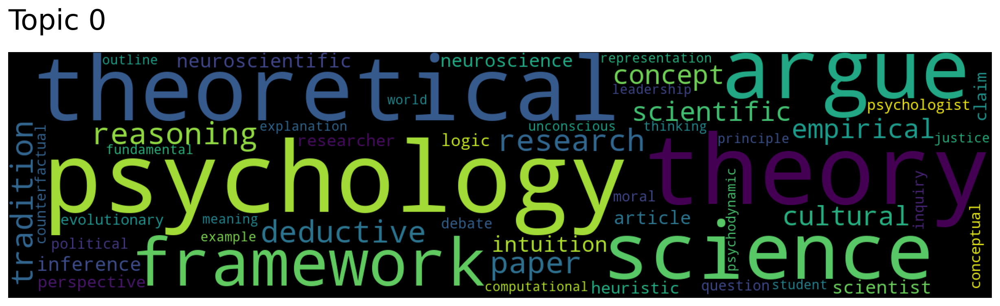

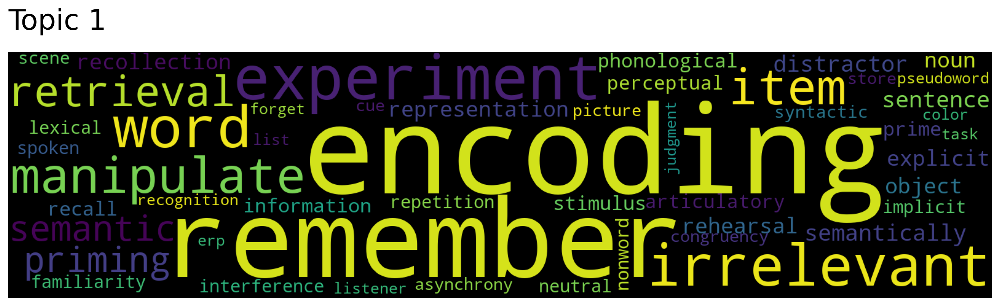

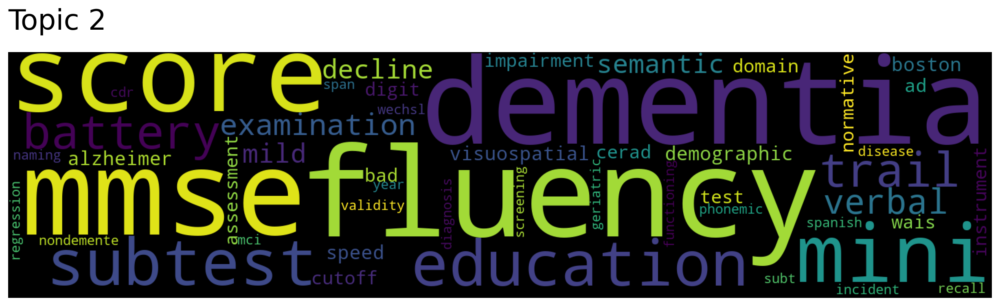

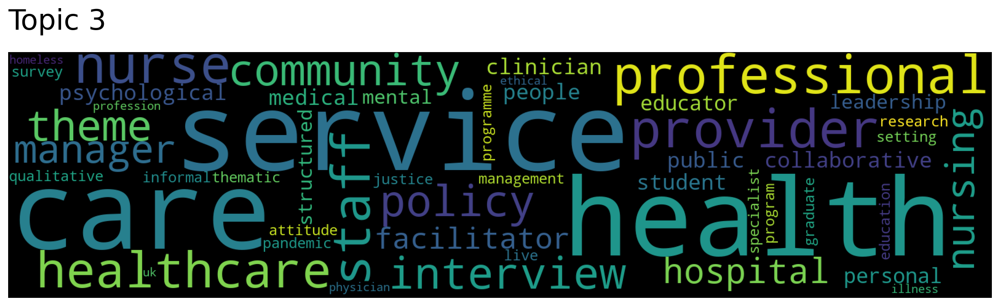

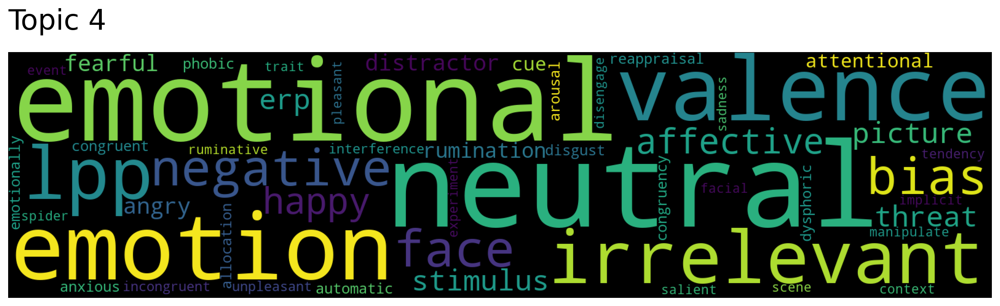

...

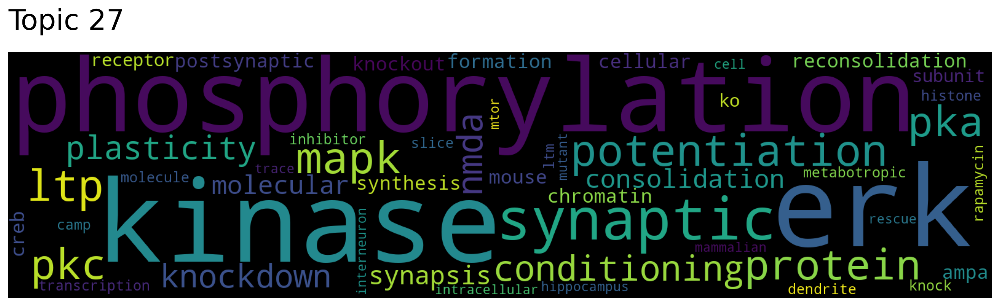

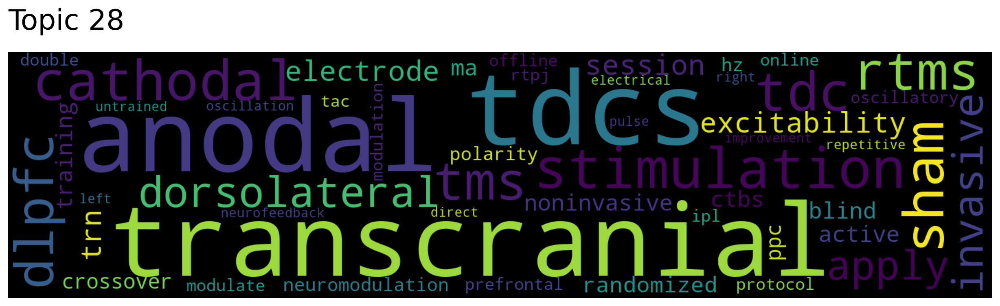

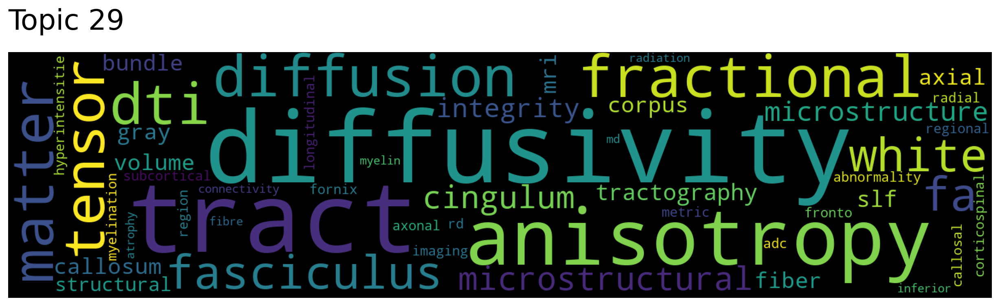

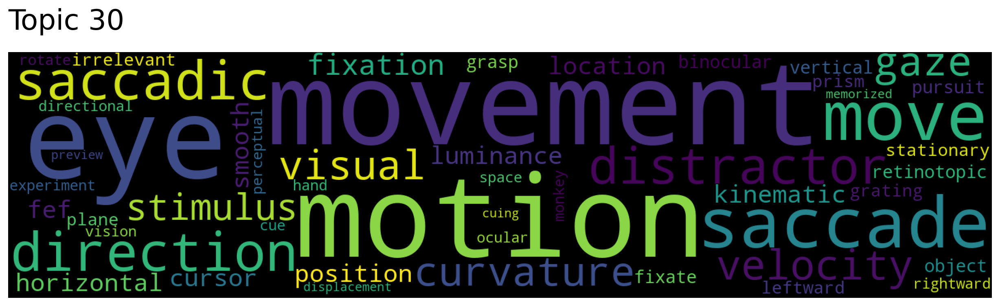

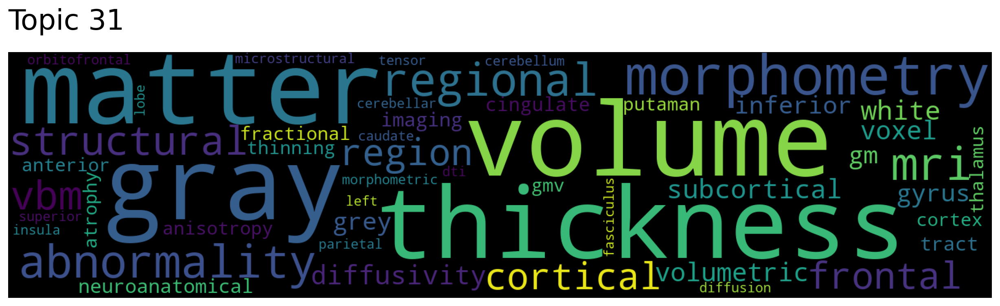

In [6]:
for topic in tqdm(range(32)): # ALL TOPICS: tqdm(range(model.get_num_topics())):
  model.generate_topic_wordcloud(topic)